# Language Translation (French to English)

The main moto of this project is to translate a text from French to English

### Importing Libraries

In [1]:
from collections import Counter
import operator
import plotly.express as px
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud, STOPWORDS
import nltk
import re
from nltk.stem import PorterStemmer, WordNetLemmatizer
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize, sent_tokenize
import gensim
from gensim.utils import simple_preprocess
from gensim.parsing.preprocessing import STOPWORDS
from tensorflow.keras.preprocessing.text import one_hot, Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, TimeDistributed, RepeatVector, Embedding, Input, LSTM, Conv1D, MaxPool1D, Bidirectional
from tensorflow.keras.models import Model


In [2]:
df_english = pd.read_csv('small_vocab_en.csv', sep = '/t', names = ['english'])
df_french = pd.read_csv('small_vocab_fr.csv', sep = '/t', names = ['french'])

<ipython-input-2-09229f3f9239>:1: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  df_english = pd.read_csv('small_vocab_en.csv', sep = '/t', names = ['english'])
<ipython-input-2-09229f3f9239>:2: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  df_french = pd.read_csv('small_vocab_fr.csv', sep = '/t', names = ['french'])


In [3]:
df = pd.concat([df_english, df_french], axis=1)
df.head()

,english,french
0,"new jersey is sometimes quiet during autumn , ...",new jersey est parfois calme pendant l' automn...
1,the united states is usually chilly during jul...,les états-unis est généralement froid en juill...
2,"california is usually quiet during march , and...","california est généralement calme en mars , et..."
3,the united states is sometimes mild during jun...,"les états-unis est parfois légère en juin , et..."
4,"your least liked fruit is the grape , but my l...","votre moins aimé fruit est le raisin , mais mo..."


In [4]:
len(df['english']), len(df['french'])

(137860, 137860)

# Data Cleaning

In [67]:
nltk.download('punkt')
nltk.download('stopwords')

[nltk_data] Downloading package punkt to C:\Users\L340 -
[nltk_data]     J4IN\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to C:\Users\L340 -
[nltk_data]     J4IN\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [68]:
def remove_punc(x):
    return re.sub('[!#?.:";]','',x)

In [69]:
df['french'] = df['french'].apply(remove_punc)
df['english'] = df['english'].apply(remove_punc)

In [70]:
english_words = []
french_words  = []

In [71]:
def get_label_superset(x, word_list):
    for label in x.split():
        if label not in word_list:
            word_list.append(label)
            

            
df['english'].apply(lambda x: get_label_superset(x, english_words))
df['french'].apply(lambda x: get_label_superset(x, french_words))

0         None
1         None
2         None
3         None
4         None
          ... 
137855    None
137856    None
137857    None
137858    None
137859    None
Name: french, Length: 137860, dtype: object

In [72]:
# the number of unique words in english
len(english_words)

200

In [74]:
total_english_words  = len(english_words)
total_english_words

200

In [75]:
# the number of unique words in french
total_french_words = len(french_words)
total_french_words

351

In [73]:
# the number of unique words in french
len(french_words)

351

### Visualization of the data


In [12]:
words = []
for i in df['english']:
    for word in i.split():
        words.append(word)
        
words[:14]

['new',
 'jersey',
 'is',
 'sometimes',
 'quiet',
 'during',
 'autumn',
 ',',
 'and',
 'it',
 'is',
 'snowy',
 'in',
 'april']

In [13]:
len( Counter(words))

200

In [14]:
# Obtain the total count of words
english_words_counts = Counter(words)

In [15]:
english_words_counts = sorted(english_words_counts.items(), key = operator.itemgetter(1), reverse = True)

In [16]:
english_words_counts[2][1]

75525

In [17]:
# append the values to a list for visualization purposes

english_words = []
english_counts = []

for i in range(len(english_words_counts)):
    english_words.append(english_words_counts[i][0])
    english_counts.append(english_words_counts[i][1])

In [18]:
english_words[:10]

['is', ',', 'in', 'it', 'during', 'the', 'but', 'and', 'sometimes', 'usually']

In [19]:
len(english_words)

200

In [20]:
english_counts[:10]

[205858, 140897, 75525, 75137, 74933, 67628, 63987, 59850, 37746, 37507]

In [21]:
fig = px.bar(x= english_words, y=english_counts)
fig.show()

In [22]:
' '.join(df.english)

"new jersey is sometimes quiet during autumn , and it is snowy in april  the united states is usually chilly during july , and it is usually freezing in november  california is usually quiet during march , and it is usually hot in june  the united states is sometimes mild during june , and it is cold in september  your least liked fruit is the grape , but my least liked is the apple  his favorite fruit is the orange , but my favorite is the grape  paris is relaxing during december , but it is usually chilly in july  new jersey is busy during spring , and it is never hot in march  our least liked fruit is the lemon , but my least liked is the grape  the united states is sometimes busy during january , and it is sometimes warm in november  the lime is her least liked fruit , but the banana is my least liked  he saw a old yellow truck  india is rainy during june , and it is sometimes warm in november  that cat was my most loved animal  he dislikes grapefruit , limes , and lemons  her leas

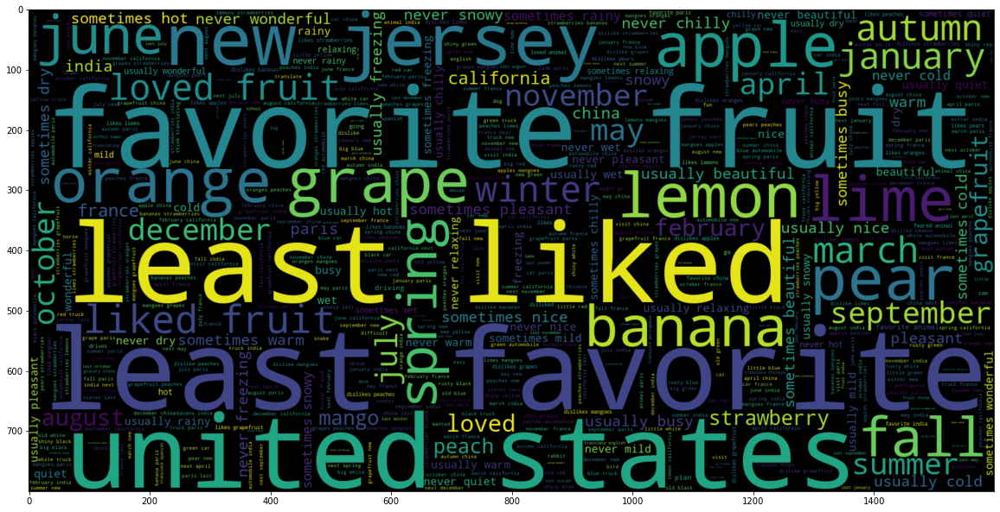

In [23]:
plt.figure(figsize = (20,20))

wc = WordCloud(max_words = 2000, width = 1600, height = 800).generate(" ".join(df.english))
plt.imshow(wc, interpolation = 'bilinear')

In [72]:
pip install --upgrade pip

   ---------------------------------------- 2.1/2.1 MB 5.4 MB/s eta 0:00:00
  Attempting uninstall: pip
    Found existing installation: pip 23.3.2
    Uninstalling pip-23.3.2:
      Successfully uninstalled pip-23.3.2
Note: you may need to restart the kernel to use updated packages.


In [70]:
pip install --upgrade Pillow

   ---------------------------------------- 2.6/2.6 MB 12.9 MB/s eta 0:00:00
  Attempting uninstall: Pillow
    Found existing installation: Pillow 8.2.0
    Uninstalling Pillow-8.2.0:
      Successfully uninstalled Pillow-8.2.0
Note: you may need to restart the kernel to use updated packages.


In [42]:
df.english[0]
nltk.word_tokenize(df.english[0])

['new',
 'jersey',
 'is',
 'sometimes',
 'quiet',
 'during',
 'autumn',
 ',',
 'and',
 'it',
 'is',
 'snowy',
 'in',
 'april']

In [43]:
# Maximum length (number of words) per document.
maxlen_english = -1
for doc in df.english:
    tokens = nltk.word_tokenize(doc)
    if(maxlen_english < len(tokens)):
        maxlen_english = len(tokens)
print("The maximum number of words in any document = ", maxlen_english)

The maximum number of words in any document =  16


In [44]:
# obtain the count of french words
words = []
for i in df['french']:
  for word in i.split():
    words.append(word)
    
words[:15]

['new',
 'jersey',
 'est',
 'parfois',
 'calme',
 'pendant',
 "l'",
 'automne',
 ',',
 'et',
 'il',
 'est',
 'neigeux',
 'en',
 'avril']

In [45]:
french_words_counts = Counter(words)

In [46]:
# sort the dictionary by values
french_words_counts = sorted(french_words_counts.items(), key = operator.itemgetter(1), reverse = True)

In [47]:
# append the values to a list for visuaization purpose
french_words = []
french_counts = []
for i in range(len(french_words_counts)):
  french_words.append(french_words_counts[i][0])
  french_counts.append(french_words_counts[i][1])

In [48]:
french_words[:10]

['est', ',', 'en', 'il', 'les', 'mais', 'et', 'la', 'parfois', 'jamais']

In [49]:
french_counts[:10]

[196809, 123135, 105768, 84079, 65255, 63987, 59851, 49861, 37746, 37215]

In [50]:
fig = px.bar(x = french_words, y = french_counts)
fig.show()

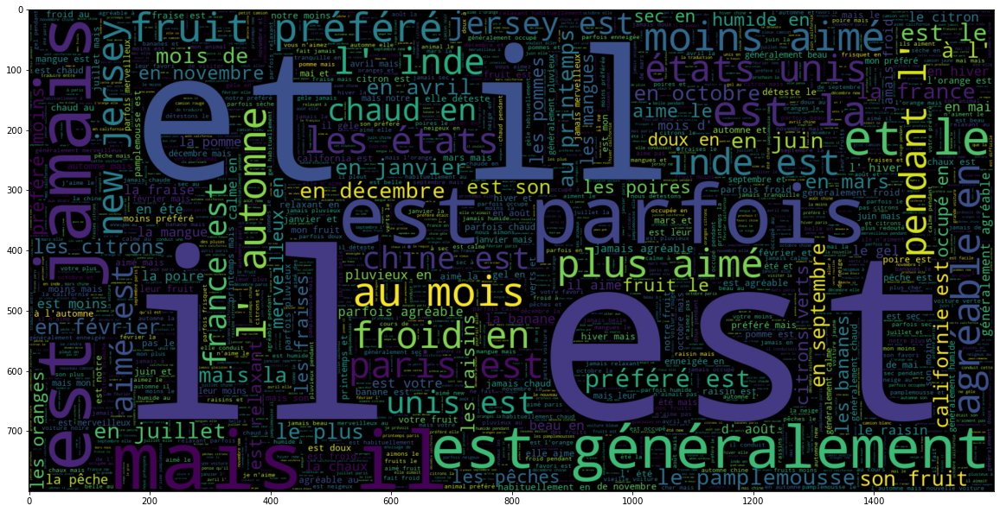

In [51]:
plt.figure(figsize = (20,20)) 
wc = WordCloud(max_words = 2000, width = 1600, height = 800 ).generate(" ".join(df.french))
plt.imshow(wc, interpolation = 'bilinear')

In [52]:
# Maximum length (number of words) per document

maxlen_french =-1
for doc in df.french:
    tokens = nltk.word_tokenize(doc)
    if(maxlen_french < len(tokens)):
        maxlen_french = len(tokens)
        
print('The maximum number of words in an document = ', maxlen_french )

The maximum number of words in an document =  24


### Tokenization and Padding

In [58]:
tokenizer = Tokenizer(char_level = False)
tokenizer.fit_on_texts(df.french[0])



In [59]:
tokenizer.word_docs

defaultdict(int,
            {'n': 6,
             'e': 12,
             'w': 1,
             'j': 1,
             'r': 3,
             's': 4,
             'y': 1,
             't': 5,
             'p': 2,
             'a': 5,
             'f': 1,
             'o': 2,
             'i': 4,
             'c': 1,
             'l': 4,
             'm': 2,
             'd': 1,
             "'": 1,
             'u': 2,
             'g': 1,
             'x': 1,
             'v': 1})

In [61]:
tokenizer.texts_to_sequences(df.french[0])

[[2],
 [1],
 [13],
 [],
 [14],
 [1],
 [8],
 [5],
 [1],
 [15],
 [],
 [1],
 [5],
 [3],
 [],
 [9],
 [4],
 [8],
 [16],
 [10],
 [6],
 [5],
 [],
 [17],
 [4],
 [7],
 [11],
 [1],
 [],
 [9],
 [1],
 [2],
 [18],
 [4],
 [2],
 [3],
 [],
 [7],
 [19],
 [],
 [4],
 [12],
 [3],
 [10],
 [11],
 [2],
 [1],
 [],
 [],
 [],
 [1],
 [3],
 [],
 [6],
 [7],
 [],
 [1],
 [5],
 [3],
 [],
 [2],
 [1],
 [6],
 [20],
 [1],
 [12],
 [21],
 [],
 [1],
 [2],
 [],
 [4],
 [22],
 [8],
 [6],
 [7],
 []]

In [62]:
tokenizer

In [63]:
def tokenize_and_pad(x, maxlen):
    tokenizer = Tokenizer(char_level = False)
    tokenizer.fit_on_texts(x)
    
    sequences = tokenizer.texts_to_sequences(x)
    padded = pad_sequences(sequences, maxlen = maxlen, padding = 'post')
    return tokenizer, sequences, padded

In [64]:
x_tokenizer, x_sequences, x_padded = tokenize_and_pad(df.french, maxlen_french)
y_tokenizer, y_sequences, y_padded = tokenize_and_pad(df.english,  maxlen_english)

In [76]:
english_vocab_size = total_english_words + 1
print('Complete English Vocab Size:', english_vocab_size)

Complete English Vocab Size: 201


In [77]:
french_vocab_size = total_french_words + 1
print("Complete French Vocab Size:", french_vocab_size)

Complete French Vocab Size: 352


In [81]:
df.english[-1:].item()

'the orange is her favorite fruit , but the banana is your favorite '

In [82]:
x_padded[-1:]

array([[84,  1, 20, 16, 17,  5,  7, 87,  1, 40, 93,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0]])

In [83]:
print("The tokenized version for document\n", df.english[-1:].item(),"\n is : ", x_padded[-1:])

The tokenized version for document
 the orange is her favorite fruit , but the banana is your favorite  
 is :  [[84  1 20 16 17  5  7 87  1 40 93  0  0  0  0  0  0  0  0  0  0  0  0  0]]


In [84]:
print("The tokenized version for document\n", df.french[-1:].item(),"\n is : ", y_padded[-1:])

The tokenized version for document
 l'orange est son fruit préféré , mais la banane est votre favori  
 is :  [[ 5 84  1 32 11 13  6  5 87  1 29 11  0  0  0  0]]


In [87]:
tokenizer.word_index.items()

dict_items([('e', 1), ('n', 2), ('t', 3), ('a', 4), ('s', 5), ('i', 6), ('l', 7), ('r', 8), ('p', 9), ('o', 10), ('m', 11), ('u', 12), ('w', 13), ('j', 14), ('y', 15), ('f', 16), ('c', 17), ('d', 18), ("'", 19), ('g', 20), ('x', 21), ('v', 22)])

In [101]:
def pad_to_text(padded, tokenizer):

    id_to_word = {id: word for word, id in tokenizer.word_index.items()}
    id_to_word[0] = ''
#     print(id_to_word)
    return ' '.join([id_to_word[j] for j in padded])

In [102]:
pad_to_text(y_padded[0], y_tokenizer)

'new jersey is sometimes quiet during autumn and it is snowy in april   '

In [107]:
# a = df.english[0]
# tkn = Tokenizer()
# tkn.fit_on_texts(a)

In [114]:
# ex = {id: word for word, id in tkn.word_index.items()}

In [119]:
# ex[0]=''

In [103]:
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(x_padded, y_padded, test_size = 0.1)

In [122]:
model = Sequential()

model.add(Embedding(french_vocab_size, 256, input_length = maxlen_french, mask_zero = True))

model.add(LSTM(256))

model.add(RepeatVector(maxlen_english))
model.add(LSTM(256, return_sequences = True))
model.add(TimeDistributed(Dense(english_vocab_size, activation ='softmax')))
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 24, 256)           90112     
                                                                 
 lstm (LSTM)                 (None, 256)               525312    
                                                                 
 repeat_vector (RepeatVecto  (None, 16, 256)           0         
 r)                                                              
                                                                 
 lstm_1 (LSTM)               (None, 16, 256)           525312    
                                                                 
 time_distributed (TimeDist  (None, 16, 201)           51657     
 ributed)                                                        
                                                                 
Total params: 1192393 (4.55 MB)
Trainable params: 1192

In [124]:
y_train.shape

(124074, 16)

In [125]:
y_train = np.expand_dims(y_train, axis=2)
y_train.shape

(124074, 16, 1)

In [126]:
model.fit(x_train, y_train, batch_size=1024, validation_split= 0.1, epochs=10)

Epoch 1/10
110/110 [==============================] - 174s 2s/step - loss: 2.9851 - accuracy: 0.3939 - val_loss: 2.1414 - val_accuracy: 0.4836
Epoch 2/10
110/110 [==============================] - 178s 2s/step - loss: 1.7165 - accuracy: 0.5499 - val_loss: 1.4764 - val_accuracy: 0.5946
Epoch 3/10
110/110 [==============================] - 190s 2s/step - loss: 1.2497 - accuracy: 0.6404 - val_loss: 1.0741 - val_accuracy: 0.6796
Epoch 4/10
110/110 [==============================] - 189s 2s/step - loss: 1.0526 - accuracy: 0.6796 - val_loss: 0.9282 - val_accuracy: 0.7016
Epoch 5/10
110/110 [==============================] - 186s 2s/step - loss: 0.8521 - accuracy: 0.7178 - val_loss: 0.8601 - val_accuracy: 0.7195
Epoch 6/10
110/110 [==============================] - 185s 2s/step - loss: 0.7737 - accuracy: 0.7375 - val_loss: 0.7353 - val_accuracy: 0.7499
Epoch 7/10
110/110 [==============================] - 185s 2s/step - loss: 0.6967 - accuracy: 0.7644 - val_loss: 0.6571 - val_accuracy: 0.7764

In [127]:
def prediction(x, x_tokenizer = x_tokenizer, y_tokenizer = y_tokenizer):
    predictions = model.predict(x)[0]
    id_to_word = {id: word for word, id in y_tokenizer.word_index.items()}
    id_to_word[0] = ''
    return ' '.join([id_to_word[j] for j in np.argmax(predictions,1)])

In [128]:
for i in range(10, 15):

  print('Original French word - {}\n'.format(pad_to_text(x_test[i], x_tokenizer)))
  print('Original English word - {}\n'.format(pad_to_text(y_test[i], y_tokenizer)))
  print('Predicted English word - {}\n\n\n\n'.format(prediction(x_test[i:i+1])))

Original French word - la france est habituellement chaud en juin mais il est jamais froid en août          

Original English word - france is usually warm during june but it is never chilly in august   

1/1 [==============================] - 3s 3s/step
Predicted English word - france is sometimes snowy during july but it is never quiet in august   




Original French word - les états unis est généralement agréable au mois d' août mais il est jamais agréable en mai       

Original English word - the united states is usually pleasant during august but it is never nice in may 

1/1 [==============================] - 0s 20ms/step
Predicted English word - the united states is sometimes snowy during february but it is never warm in may 




Original French word - nous détestons les bananes les pommes et les pêches               

Original English word - we dislike bananas apples and peaches          

1/1 [==============================] - 0s 28ms/step
Predicted English word - i dislike